In [246]:
# Dataset naam: wavedata and seawatertemperatures - seawatertemperatures, waveperiodes and -heights at a 10 minute interval
# URL:          https://dataplatform.knmi.nl/dataset/golven-en-zeewater-1-0
# Doel:         bepaal de golfhoogte op basis van de golffrequentie

In [247]:
pip install pandas matplotlib

Note: you may need to restart the kernel to use updated packages.


In [248]:
import pandas               as pd
import matplotlib.pyplot    as plt

In [249]:
# Read data file
df = pd.read_csv(".\data\golven_en_zeewater\dataMerged_small_set.csv", ";")

# Remove white spaces from data
print("Removing white space...")
df.columns = df.columns.str.replace(' ','')
print("Removing white space... Done")

# replace NaN values with column average
print("Replacing NaN values with column average...")
df = df.fillna(df.mean())
print("Replacing NaN values with column average... Done")

del df['DTG']
del df['LOCATION']
del df['NAME']
# Set data type for the date column to DateTime
# df['DTG'] = pd.to_datetime(df['DTG'])
# print("Changing data type of 'DTG' to datetime")


Removing white space...
Removing white space... Done
Replacing NaN values with column average...
Replacing NaN values with column average... Done


In [250]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64803 entries, 0 to 64802
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   LATITUDE       64803 non-null  float64
 1   LONGITUDE      64803 non-null  float64
 2   ALTITUDE       64803 non-null  float64
 3   PT_WAVE_10     64803 non-null  float64
 4   T_SEAWATER_10  64803 non-null  float64
 5   A_WAVE_10      64803 non-null  float64
dtypes: float64(6)
memory usage: 3.0 MB


In [251]:
df.isnull().sum()

LATITUDE         0
LONGITUDE        0
ALTITUDE         0
PT_WAVE_10       0
T_SEAWATER_10    0
A_WAVE_10        0
dtype: int64

In [252]:
df.head(10)

,LATITUDE,LONGITUDE,ALTITUDE,PT_WAVE_10,T_SEAWATER_10,A_WAVE_10
0,53217778.0,3220278.0,377.0,45.0,79.0,80.0
1,53217778.0,3220278.0,377.0,46.0,79.0,83.0
2,53217778.0,3220278.0,377.0,46.0,79.0,82.0
3,53217778.0,3220278.0,377.0,45.0,79.0,80.0
4,53217778.0,3220278.0,377.0,46.0,79.0,75.0
5,53217778.0,3220278.0,377.0,45.0,79.0,70.0
6,53217778.0,3220278.0,377.0,44.0,79.0,70.0
7,53217778.0,3220278.0,377.0,46.0,79.0,72.0
8,53217778.0,3220278.0,377.0,45.0,79.0,74.0
9,53217778.0,3220278.0,377.0,45.0,79.0,71.0


In [253]:
df.tail(10)

,LATITUDE,LONGITUDE,ALTITUDE,PT_WAVE_10,T_SEAWATER_10,A_WAVE_10
64793,51997778.0,3275.0,19.0,56.0,85.0,80.0
64794,51997778.0,3275.0,19.0,56.0,85.0,80.0
64795,51997778.0,3275.0,19.0,55.0,85.0,77.0
64796,51997778.0,3275.0,19.0,56.0,85.0,77.0
64797,51997778.0,3275.0,19.0,56.0,85.0,80.0
64798,51997778.0,3275.0,19.0,54.0,85.0,79.0
64799,51997778.0,3275.0,19.0,54.0,85.0,79.0
64800,51997778.0,3275.0,19.0,56.0,85.0,80.0
64801,51997778.0,3275.0,19.0,56.0,85.0,79.0
64802,51997778.0,3275.0,19.0,56.0,85.0,72.0


In [254]:
df.corr()
# De correlatie van deze dataset is vrij laag. De latitude, longitude en altitude vertonen een hoge correlatie, maar hebben feitelijk niks met elkaar te maken.

,LATITUDE,LONGITUDE,ALTITUDE,PT_WAVE_10,T_SEAWATER_10,A_WAVE_10
LATITUDE,1.000000,0.998810,0.998384,0.127641,-0.034342,0.212279
LONGITUDE,0.998810,1.000000,0.999967,0.127110,-0.030679,0.209166
ALTITUDE,0.998384,0.999967,1.000000,0.126993,-0.030066,0.208603
PT_WAVE_10,0.127641,0.127110,0.126993,1.000000,-0.035705,0.395353
T_SEAWATER_10,-0.034342,-0.030679,-0.030066,-0.035705,1.000000,-0.045923
A_WAVE_10,0.212279,0.209166,0.208603,0.395353,-0.045923,1.000000


In [255]:
# LOCATION = identifier, NAME = identifier, LATITUDE in degrees (WGS84), LONGITUDE in degrees (WGS84), ALTITUDE in 0.1 m relative to Mean Sea Level (MSL)
# PT_WAVE_10 is periodetijd zee golven gemiddeld over 10 minuten eenheid seconde
# T_SEAWATER_10 is temperatuur zeewater onder wateroppervlak 10 minuten eenheid graad C
# A_WAVE_10 is amplitude zee golven gemiddeld over 10 minuten eenheid cm

X = df[['PT_WAVE_10']]
y = df[['A_WAVE_10']]

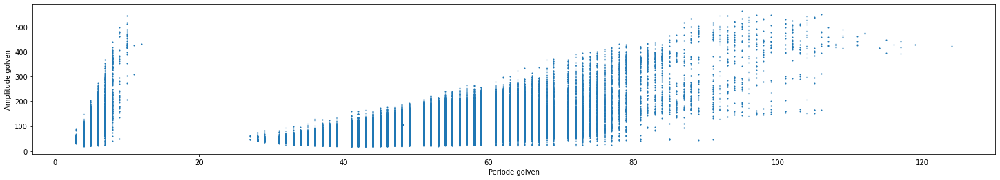

In [256]:
# Plot the measurements

fig = plt.figure()
plt.scatter(X, y, s=1)
plt.ylabel("Amplitude golven")
plt.xlabel("Periode golven")
fig.set_figheight(4)
fig.set_figwidth(25)
plt.show()

In [257]:
# gebaseerd op de resulterende data blobs, knippen we de data op in 2 delen: van 0 naar 10, en vanaf 25. Het stuk zonder data (10-25) laten we verder buiten beschouwing

X_0_10 = (df.loc[df['PT_WAVE_10'] <= 10, 'PT_WAVE_10']).to_frame()
y_0_10 = (df.loc[df['PT_WAVE_10'] <= 10, 'A_WAVE_10']).to_frame()

X_25_up = (df.loc[df['PT_WAVE_10'] >= 25, 'PT_WAVE_10']).to_frame()
y_25_up = (df.loc[df['PT_WAVE_10'] >= 25, 'A_WAVE_10']).to_frame()

In [258]:
# Train the model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X_train_0_10, X_test_0_10, y_train_0_10, y_test_0_10 = train_test_split(X_0_10 , y_0_10, test_size=0.2)
linReg_0_10 = LinearRegression()
linReg_0_10.fit(X_train_0_10 , y_train_0_10)

X_train_25_up, X_test_25_up, y_train_25_up, y_test_25_up = train_test_split(X_25_up , y_25_up, test_size=0.2)
linReg_25_up = LinearRegression()
linReg_25_up.fit(X_train_25_up , y_train_25_up)

LinearRegression()

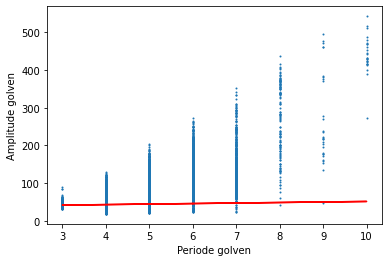

In [259]:
# Plot the measurements and the prediction line for the small training data part

fig1 = plt.figure()
plt.scatter(X_train_0_10, y_train_0_10, s=1)
plt.plot(X_train_0_10, linReg.predict(X_train_0_10), color='r')
plt.ylabel("Amplitude golven")
plt.xlabel("Periode golven")
fig.set_figheight(4)
fig.set_figwidth(25)
plt.show()

# Blijkbaar zitten er meer puntjes in de lagere y-waarden.

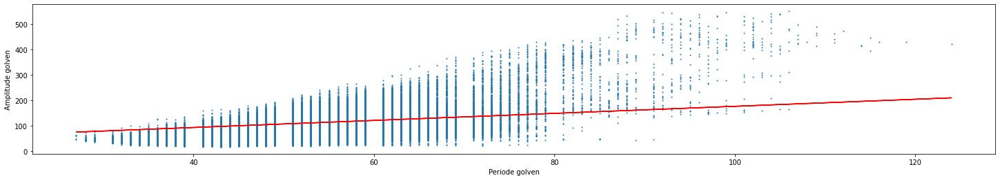

In [260]:
# Plot the measurements and the prediction line for the large training data part

fig = plt.figure()
plt.scatter(X_train_25_up, y_train_25_up, s=1)
plt.plot(X_train_25_up, linReg.predict(X_train_25_up.astype(int)), color='r')
plt.ylabel("Amplitude golven")
plt.xlabel("Periode golven")
fig.set_figheight(4)
fig.set_figwidth(25)
plt.show()

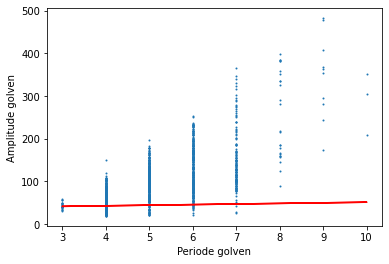

In [261]:
# Plot the measurements and the prediction line for the small test data part

fig1 = plt.figure()
plt.scatter(X_test_0_10, y_test_0_10, s=1)
plt.plot(X_test_0_10, linReg.predict(X_test_0_10), color='r')
plt.ylabel("Amplitude golven")
plt.xlabel("Periode golven")
fig.set_figheight(4)
fig.set_figwidth(25)
plt.show()

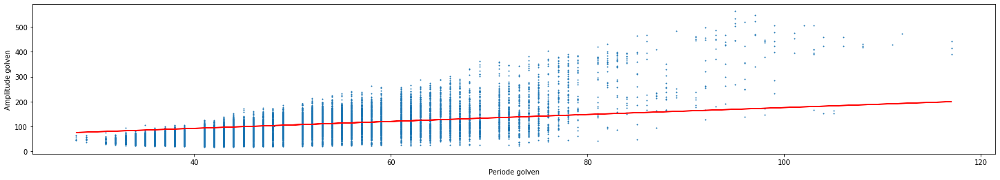

In [262]:
# Plot the measurements and the prediction line for the large test data part

fig = plt.figure()
plt.scatter(X_test_25_up, y_test_25_up, s=1)
plt.plot(X_test_25_up, linReg.predict(X_test_25_up.astype(int)), color='r')
plt.ylabel("Amplitude golven")
plt.xlabel("Periode golven")
fig.set_figheight(4)
fig.set_figwidth(25)
plt.show()

In [263]:
# Predict the wave amplitude when the wave period is 8
linReg.predict([[8]])

array([[48.31756903]])

In [264]:
# Predict the wave amplitude when the wave period is 60
linReg.predict([[8]])

array([[48.31756903]])

In [265]:
# De nauwkeurigheid van de voorspellingen zal laag zijn. Dit komt door de lage correlatie, en het gat in de data zoals te zien in de plots.